<a href="https://colab.research.google.com/github/Jyotirmoy-99/Physics/blob/main/Double_slit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

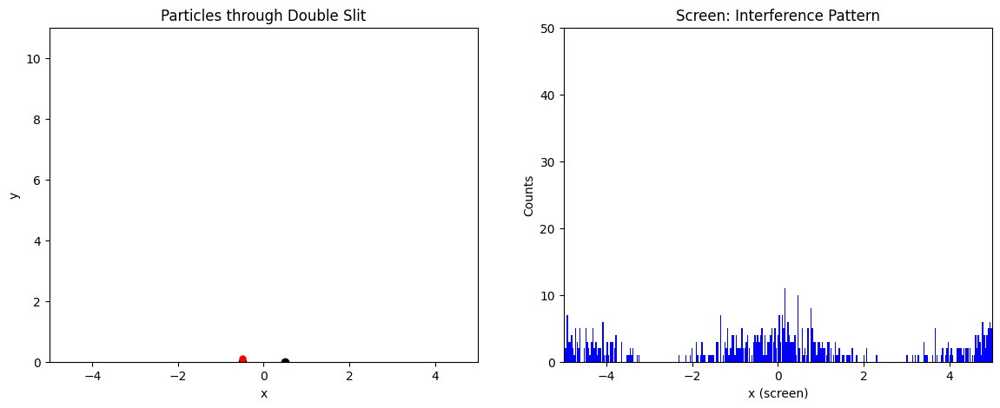

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

# Parameters
wavelength = 0.5
k = 2 * np.pi / wavelength
screen_y = 10
slit_separation = 1.0
slit1_x = -slit_separation / 2
slit2_x = slit_separation / 2

# Detector screen
x_bins = np.linspace(-5, 5, 300)
bin_centers = (x_bins[:-1] + x_bins[1:]) / 2
hist = np.zeros_like(bin_centers)

# Probability distribution from interference
def interference_prob(x):
    r1 = np.sqrt((x - slit1_x)**2 + screen_y**2)
    r2 = np.sqrt((x - slit2_x)**2 + screen_y**2)
    phase_diff = k * (r1 - r2)
    intensity = (np.cos(phase_diff / 2))**2
    return intensity / np.max(intensity)

pdf = interference_prob(bin_centers)
cdf = np.cumsum(pdf)
cdf /= cdf[-1]  # normalize to 1

def sample_position():
    r = np.random.rand()
    return np.interp(r, cdf, bin_centers)

# --- Plot Setup ---
fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(14, 5))

# Left: Particle trajectories
ax_left.set_xlim(-5, 5)
ax_left.set_ylim(0, 11)
ax_left.set_title("Particles through Double Slit")
ax_left.set_xlabel("x")
ax_left.set_ylabel("y")
ax_left.plot(slit1_x, 0, 'ko', label="Slit 1")
ax_left.plot(slit2_x, 0, 'ko', label="Slit 2")
particle_dot, = ax_left.plot([], [], 'ro', markersize=5)

# Right: Intensity accumulation
bars = ax_right.bar(bin_centers, hist, width=0.03, color='blue')
ax_right.set_xlim(-5, 5)
ax_right.set_ylim(0, 50)
ax_right.set_title("Screen: Interference Pattern")
ax_right.set_xlabel("x (screen)")
ax_right.set_ylabel("Counts")

# --- Animation ---
def init():
    particle_dot.set_data([], [])
    for bar in bars:
        bar.set_height(0)
    return [particle_dot] + list(bars)

def update(frame):
    global hist

    # Sample particle hit from interference pattern
    x_hit = sample_position()
    idx = np.searchsorted(bin_centers, x_hit)
    if 0 <= idx < len(hist):
        hist[idx] += 1

    # Update bars
    for bar, h in zip(bars, hist):
        bar.set_height(h)

    # Choose a slit visually (randomly)
    x_slit = slit1_x if np.random.rand() < 0.5 else slit2_x
    particle_dot.set_data([x_slit], [0.1])  # Reset to bottom

    return [particle_dot] + list(bars)

ani = animation.FuncAnimation(fig, update, init_func=init, frames=500, interval=10, blit=True)

# Display animation in Jupyter/Colab
HTML(ani.to_jshtml())


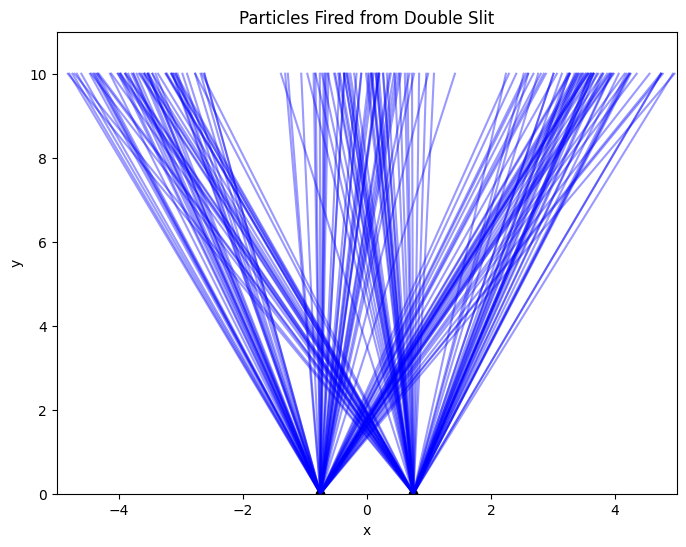

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

# Parameters
wavelength = 0.5
k = 2 * np.pi / wavelength
screen_y = 10
slit_separation = 1.5
slit1_x = -slit_separation / 2
slit2_x = slit_separation / 2
num_particles = 200

# Probability distribution (quantum interference)
x_vals = np.linspace(-5, 5, 300)
r1 = np.sqrt((x_vals - slit1_x)**2 + screen_y**2)
r2 = np.sqrt((x_vals - slit2_x)**2 + screen_y**2)
intensity = (np.cos(k * (r1 - r2) / 2))**2
intensity /= np.max(intensity)
cdf = np.cumsum(intensity)
cdf /= cdf[-1]

def sample_hit():
    r = np.random.rand()
    return np.interp(r, cdf, x_vals)

# Set up the plot
fig, ax = plt.subplots(figsize=(8, 6))
ax.set_xlim(-5, 5)
ax.set_ylim(0, screen_y + 1)
ax.set_title("Particles Fired from Double Slit")
ax.set_xlabel("x")
ax.set_ylabel("y")

# Draw slits
ax.plot(slit1_x, 0, 'ko')
ax.plot(slit2_x, 0, 'ko')

paths = []

def init():
    return []

def update(frame):
    x_hit = sample_hit()
    x_slit = slit1_x if np.random.rand() < 0.5 else slit2_x
    path, = ax.plot([x_slit, x_hit], [0, screen_y], color='blue', alpha=0.4)
    paths.append(path)
    return [path]

ani1 = animation.FuncAnimation(fig, update, frames=num_particles, init_func=init,
                              blit=True, interval=50)

# Save to file
ani1.save('/content/trajectory_particles.mp4', writer='ffmpeg', fps=20)
HTML('<b>Saved:</b> <a href="/content/trajectory_particles.mp4" download>Download Trajectory Animation</a>')



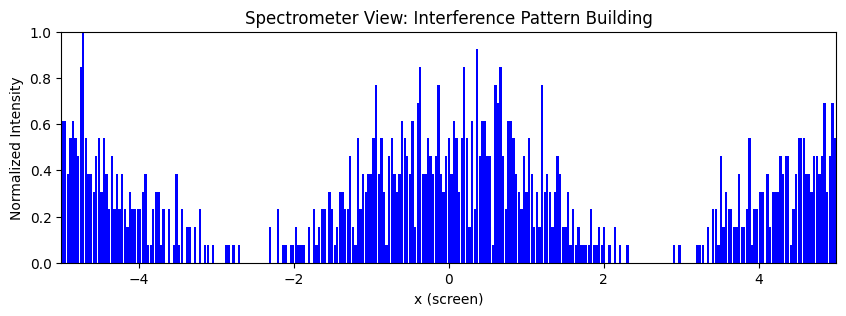

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

# Same distribution
hist = np.zeros_like(x_vals[:-1])
bin_centers = (x_vals[:-1] + x_vals[1:]) / 2

fig2, ax2 = plt.subplots(figsize=(10, 3))
ax2.set_xlim(-5, 5)
ax2.set_ylim(0, 1)
ax2.set_title("Spectrometer View: Interference Pattern Building")
ax2.set_xlabel("x (screen)")
ax2.set_ylabel("Normalized Intensity")

bars = ax2.bar(bin_centers, hist, width=0.03, color='blue')

def update_spectrometer(frame):
    global hist
    x_hit = sample_hit()
    idx = np.searchsorted(bin_centers, x_hit)
    if 0 <= idx < len(hist):
        hist[idx] += 1
    norm_hist = hist / np.max(hist) if np.max(hist) > 0 else hist
    for bar, h in zip(bars, norm_hist):
        bar.set_height(h)
    return list(bars)

ani2 = animation.FuncAnimation(fig2, update_spectrometer, frames=1000, interval=5, blit=True)

# Save to file
ani2.save('/content/spectrometer_view.mp4', writer='ffmpeg', fps=30)
HTML('<b>Saved:</b> <a href="/content/spectrometer_view.mp4" download>Download Spectrometer Animation</a>')


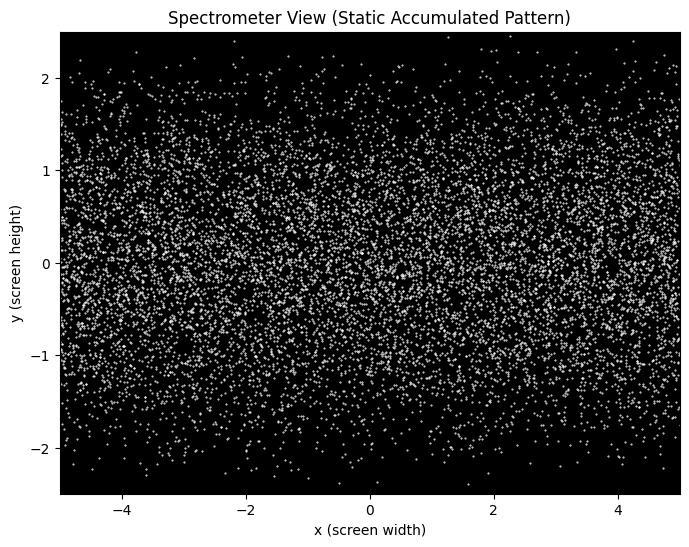

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
wavelength = 0.5
k = 2 * np.pi / wavelength
screen_width = 10     # x-axis size
screen_height = 5     # y-axis size
num_particles = 10000

# Slit setup
slit_separation = 1.0
slit1_y = -slit_separation / 2
slit2_y = slit_separation / 2
screen_x = 10

# Grid for computing interference
y_vals = np.linspace(-screen_height/2, screen_height/2, 1000)
r1 = np.sqrt((screen_x)**2 + (y_vals - slit1_y)**2)
r2 = np.sqrt((screen_x)**2 + (y_vals - slit2_y)**2)
intensity = (np.cos(k * (r1 - r2) / 2))**2
intensity /= intensity.max()

# Build cumulative distribution function (CDF) for sampling
cdf = np.cumsum(intensity)
cdf /= cdf[-1]

# Sample y positions based on CDF
def sample_y():
    r = np.random.rand()
    return np.interp(r, cdf, y_vals)

# Sample random particle hits
x_hits = np.random.uniform(-screen_width/2, screen_width/2, num_particles)  # uniformly along screen width
y_hits = np.array([sample_y() for _ in range(num_particles)])               # quantum interference decides vertical position

# Plot the screen as seen from spectrometer
plt.figure(figsize=(8, 6))
plt.scatter(x_hits, y_hits, s=0.2, color='white')  # tiny white dots on black screen
plt.xlim(-screen_width/2, screen_width/2)
plt.ylim(-screen_height/2, screen_height/2)
plt.gca().set_facecolor('black')
plt.title("Spectrometer View (Static Accumulated Pattern)")
plt.xlabel("x (screen width)")
plt.ylabel("y (screen height)")
plt.show()


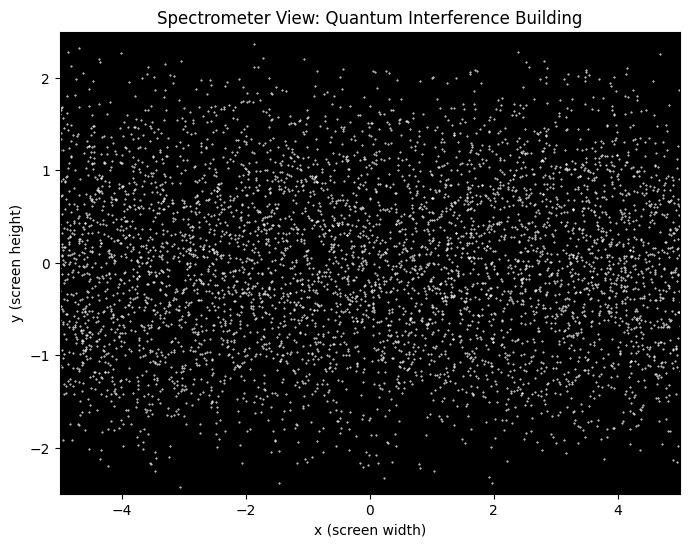

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

# Parameters
wavelength = 0.5
k = 2 * np.pi / wavelength
screen_width = 10
screen_height = 5
slit_separation = 1.0
slit1_y = -slit_separation / 2
slit2_y = slit_separation / 2
screen_x = 10

# Particle count and sampling
num_particles = 5000
particles_per_frame = 10
total_frames = num_particles // particles_per_frame

# Interference-based y-distribution
y_vals = np.linspace(-screen_height/2, screen_height/2, 1000)
r1 = np.sqrt(screen_x**2 + (y_vals - slit1_y)**2)
r2 = np.sqrt(screen_x**2 + (y_vals - slit2_y)**2)
intensity = (np.cos(k * (r1 - r2) / 2))**2
intensity /= intensity.max()
cdf = np.cumsum(intensity)
cdf /= cdf[-1]

# Sampling functions
def sample_y():
    r = np.random.rand()
    return np.interp(r, cdf, y_vals)

def sample_particles(n):
    xs = np.random.uniform(-screen_width/2, screen_width/2, n)
    ys = [sample_y() for _ in range(n)]
    return xs, ys

# Setup figure
fig, ax = plt.subplots(figsize=(8, 6))
ax.set_xlim(-screen_width/2, screen_width/2)
ax.set_ylim(-screen_height/2, screen_height/2)
ax.set_facecolor('black')
ax.set_title("Spectrometer View: Quantum Interference Building")
ax.set_xlabel("x (screen width)")
ax.set_ylabel("y (screen height)")

scat = ax.scatter([], [], s=0.2, color='white')

# Data storage
all_x = []
all_y = []

def init():
    scat.set_offsets(np.empty((0, 2)))  # FIXED: empty 2D array
    return [scat]

def update(frame):
    global all_x, all_y
    new_x, new_y = sample_particles(particles_per_frame)
    all_x.extend(new_x)
    all_y.extend(new_y)
    coords = np.column_stack((all_x, all_y))
    scat.set_offsets(coords)
    return [scat]

# Create animation
ani = animation.FuncAnimation(fig, update, init_func=init,
                              frames=total_frames, interval=20, blit=True)

# Save animation
output_path = "/content/spectrometer_quantum_animation.mp4"
ani.save(output_path, writer='ffmpeg', fps=30)

# Display link
HTML(f'<b>✅ Animation saved:</b> <a href="{output_path}" download>Download Video</a>')


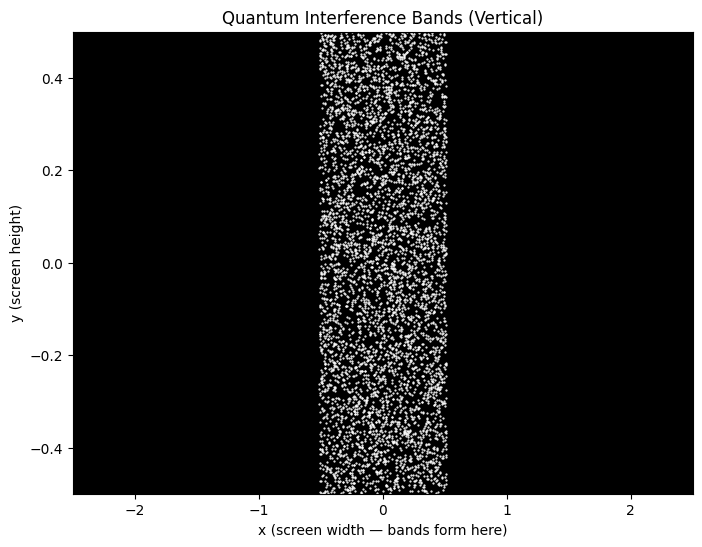

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
wavelength = 0.5
k = 2 * np.pi / wavelength
L = 10                     # Distance to screen
d = 1.0                    # Slit separation (vertical slits)

# Slit positions (vertically aligned)
slit1_x = -d / 2
slit2_x = d / 2

# Screen setup
screen_width = 5.0
screen_height = 1.0
num_particles = 5000

# X-axis: where the bands will appear (horizontal bands)
x_vals = np.linspace(-screen_width / 2, screen_width / 2, 5000)

# Interference pattern based on horizontal spread
r1 = np.sqrt(L**2 + (x_vals - slit1_x)**2)
r2 = np.sqrt(L**2 + (x_vals - slit2_x)**2)
delta_phi = k * (r1 - r2)
intensity = (np.cos(delta_phi / 2))**2

# Threshold for hard band visibility
threshold = 0.9
allowed_x_vals = x_vals[intensity > threshold]

# Sample from bright bands only
sampled_x = np.random.choice(allowed_x_vals, size=num_particles)

# Sample y uniformly (screen height)
sampled_y = np.random.uniform(-screen_height / 2, screen_height / 2, num_particles)

# Plot: now bands appear vertically
plt.figure(figsize=(8, 6))
plt.scatter(sampled_x, sampled_y, s=0.3, color='white')
plt.xlim(-screen_width / 2, screen_width / 2)
plt.ylim(-screen_height / 2, screen_height / 2)
plt.gca().set_facecolor('black')
plt.xlabel("x (screen width — bands form here)")
plt.ylabel("y (screen height)")
plt.title("Quantum Interference Bands (Vertical)")
plt.show()


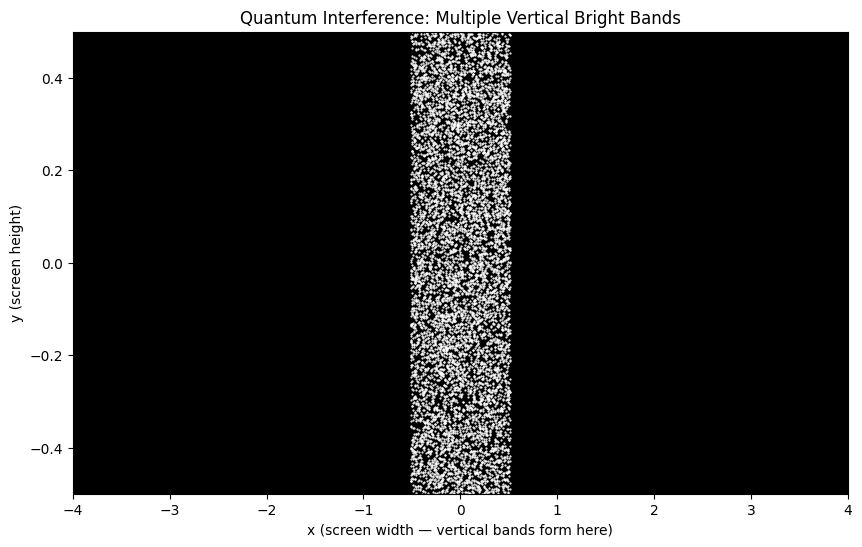

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters (adjusted)
wavelength = 0.5
k = 2 * np.pi / wavelength
L = 10
d = 1.0                      # SMALLER slit separation

# Slit positions (vertical slits)
slit1_x = -d / 2
slit2_x = d / 2

# Wider screen
screen_width = 8.0
screen_height = 1.0
num_particles = 8000         # Enough to populate bands

# x-axis: where vertical bands form
x_vals = np.linspace(-screen_width / 2, screen_width / 2, 8000)
r1 = np.sqrt(L**2 + (x_vals - slit1_x)**2)
r2 = np.sqrt(L**2 + (x_vals - slit2_x)**2)
delta_phi = k * (r1 - r2)
intensity = (np.cos(delta_phi / 2))**2

# Thresholding for sharp contrast
threshold = 0.9
allowed_x_vals = x_vals[intensity > threshold]

# Sample from bright zones
sampled_x = np.random.choice(allowed_x_vals, size=num_particles)
sampled_y = np.random.uniform(-screen_height / 2, screen_height / 2, num_particles)

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(sampled_x, sampled_y, s=0.3, color='white')
plt.xlim(-screen_width / 2, screen_width / 2)
plt.ylim(-screen_height / 2, screen_height / 2)
plt.gca().set_facecolor('black')
plt.xlabel("x (screen width — vertical bands form here)")
plt.ylabel("y (screen height)")
plt.title("Quantum Interference: Multiple Vertical Bright Bands")
plt.show()


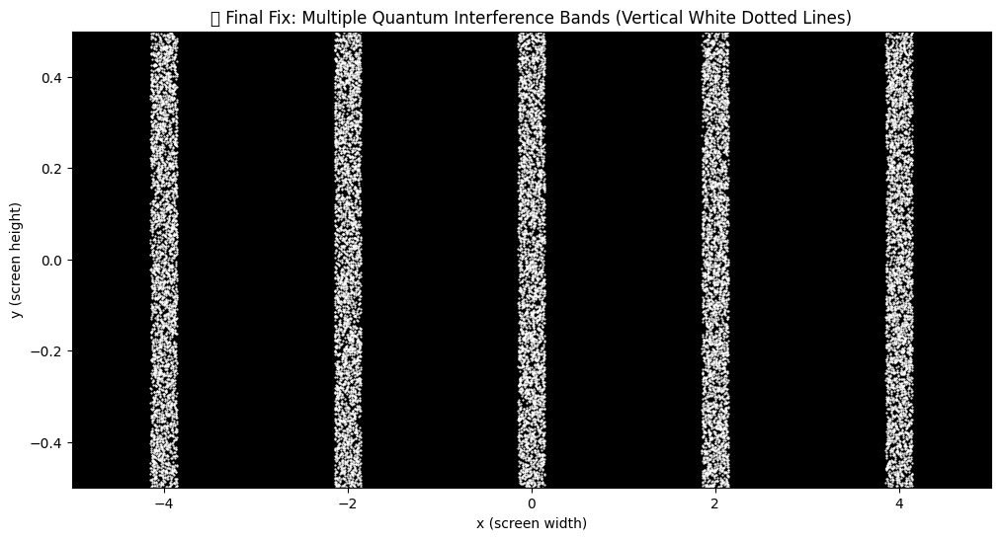

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
wavelength = 0.2        # Light wavelength
d = 2.0                 # Slit separation
L = 20                  # Slit to screen distance
num_particles = 15000   # Number of quantum particles
screen_width = 10       # x-range for multiple fringes
screen_height = 1.0     # y-range

# x grid for interference pattern
x_vals = np.linspace(-screen_width/2, screen_width/2, 10000)

# Compute ideal interference pattern (physics correct!)
arg = (np.pi * d * x_vals) / (wavelength * L)
intensity = np.cos(arg) ** 2
intensity /= intensity.max()

# Select x-positions from high-intensity regions
threshold = 0.95
bright_x_vals = x_vals[intensity > threshold]

# Sample x only from bright regions
sampled_x = np.random.choice(bright_x_vals, size=num_particles)

# Sample y uniformly
sampled_y = np.random.uniform(-screen_height/2, screen_height/2, num_particles)

# Plot the result
plt.figure(figsize=(12, 6))
plt.scatter(sampled_x, sampled_y, s=0.3, color='white')
plt.xlim(-screen_width/2, screen_width/2)
plt.ylim(-screen_height/2, screen_height/2)
plt.gca().set_facecolor('black')
plt.xlabel("x (screen width)")
plt.ylabel("y (screen height)")
plt.title("✅ Final Fix: Multiple Quantum Interference Bands (Vertical White Dotted Lines)")
plt.show()


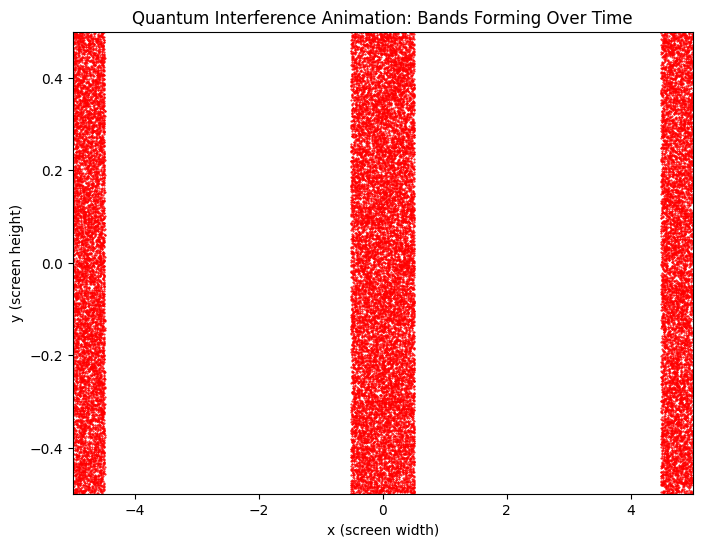

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, FFMpegWriter

# Parameters
wavelength = 0.5
d = 1.0
L = 10
screen_width = 10
screen_height = 1.0
num_particles = 30000

x_vals = np.linspace(-screen_width / 2, screen_width / 2, 10000)
arg = (np.pi * d * x_vals) / (wavelength * L)
intensity = np.cos(arg) ** 2
intensity /= intensity.max()
threshold = 0.90
bright_x_vals = x_vals[intensity > threshold]

sampled_x = np.random.choice(bright_x_vals, size=num_particles)
sampled_y = np.random.uniform(-screen_height / 2, screen_height / 2, num_particles)

# Animation setup
frames = 200
particles_per_frame = num_particles // frames

fig, ax = plt.subplots(figsize=(8, 6))
ax.set_xlim(-screen_width / 2, screen_width / 2)
ax.set_ylim(-screen_height / 2, screen_height / 2)
ax.set_facecolor('white')
ax.set_xlabel("x (screen width)")
ax.set_ylabel("y (screen height)")
ax.set_title("Quantum Interference Animation: Bands Forming Over Time")
scat = ax.scatter([], [], s=0.25, color='red')

def update(frame):
    end = (frame + 1) * particles_per_frame
    current_x = sampled_x[:end]
    current_y = sampled_y[:end]
    scat.set_offsets(np.column_stack((current_x, current_y)))
    return scat,

ani = FuncAnimation(fig, update, frames=frames, interval=50, blit=True)

# Save as MP4
ani.save("quantum_interference_bands.mp4", writer=FFMpegWriter(fps=30))


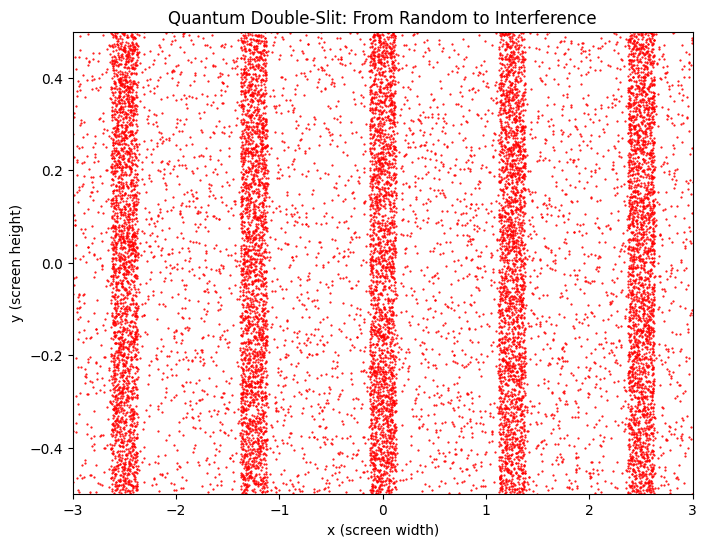

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, FFMpegWriter

# Parameters for quantum double slit
wavelength = 0.25
d = 2.0
L = 10
screen_width = 6.0
screen_height = 1.0
total_particles = 15000
random_fraction = 0.3
random_particles = int(total_particles * random_fraction)
interference_particles = total_particles - random_particles

# Create random uniform particles
rand_x = np.random.uniform(-screen_width / 2, screen_width / 2, random_particles)
rand_y = np.random.uniform(-screen_height / 2, screen_height / 2, random_particles)

# Create interference-based particles
x_vals = np.linspace(-screen_width / 2, screen_width / 2, 10000)
arg = (np.pi * d * x_vals) / (wavelength * L)
intensity = np.cos(arg)**2
intensity /= intensity.max()
threshold = 0.90
bright_x_vals = x_vals[intensity > threshold]

intf_x = np.random.choice(bright_x_vals, size=interference_particles)
intf_y = np.random.uniform(-screen_height / 2, screen_height / 2, interference_particles)

# Merge and shuffle
all_x = np.concatenate((rand_x, intf_x))
all_y = np.concatenate((rand_y, intf_y))
indices = np.arange(total_particles)
np.random.shuffle(indices)
all_x = all_x[indices]
all_y = all_y[indices]

# Animation setup
frames = 200
particles_per_frame = total_particles // frames
fig, ax = plt.subplots(figsize=(8, 6))
ax.set_xlim(-screen_width / 2, screen_width / 2)
ax.set_ylim(-screen_height / 2, screen_height / 2)
ax.set_facecolor('white')
ax.set_xlabel("x (screen width)")
ax.set_ylabel("y (screen height)")
ax.set_title("Quantum Double-Slit: From Random to Interference")
scat = ax.scatter([], [], s=0.3, color='red')

def update(frame):
    end = (frame + 1) * particles_per_frame
    current_x = all_x[:end]
    current_y = all_y[:end]
    scat.set_offsets(np.column_stack((current_x, current_y)))
    return scat,

ani = FuncAnimation(fig, update, frames=frames, interval=50, blit=True)

# Save animation in Colab
ani.save("quantum_random_to_interference.mp4", writer=FFMpegWriter(fps=30))
